In [19]:
import scipy as sci
from scipy.io import loadmat
import numpy as np
import cv2
import imageio
import matplotlib.pyplot as plt
import sys
import pathlib
sys.path.append('src')

In [38]:
import importlib
import models
importlib.reload(models)

<module 'models' from '/home/PJLAB/weigengchen/CodeSpace/projects/ASM/ASM/src/models.py'>

# prepare data

In [28]:
from data_loader import load_data
landmarks, face_files = load_data()
landmarks.shape, len(face_files), face_files[:5]

((152, 228),
 228,
 ['DATA/valid_faces/i000qa-fn.jpg',
  'DATA/valid_faces/i000ra-fn.jpg',
  'DATA/valid_faces/i000sa-fn.jpg',
  'DATA/valid_faces/i001qa-mn.jpg',
  'DATA/valid_faces/i001ra-mn.jpg'])

In [29]:
landmarks

array([[201. , 187. , 190. , ..., 160. , 142. , 143. ],
       [348. , 326. , 344. , ..., 312. , 347. , 342. ],
       [201. , 184. , 191. , ..., 154. , 141. , 140. ],
       ...,
       [342.5, 335.5, 334. , ..., 310. , 344. , 341. ],
       [340. , 344.5, 342.4, ..., 323.5, 309.5, 310. ],
       [340.5, 334.5, 330.7, ..., 310. , 340. , 338. ]])

In [30]:
kk = landmarks.reshape(-1, 2, 228)[:10,:,0]
print(kk)
print(landmarks[:20,0])

[[201. 348.]
 [201. 381.]
 [202. 408.]
 [209. 435.]
 [224. 461.]
 [241. 483.]
 [264. 498.]
 [292. 501.]
 [319. 493.]
 [338. 470.]]
[201. 348. 201. 381. 202. 408. 209. 435. 224. 461. 241. 483. 264. 498.
 292. 501. 319. 493. 338. 470.]


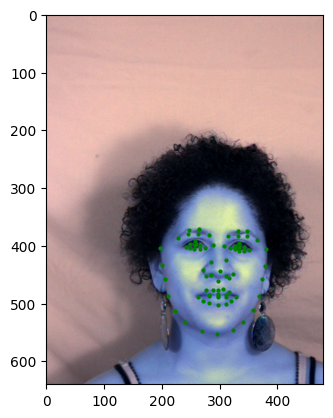

In [31]:
im1 = cv2.imread(face_files[200])
plt.imshow(im1)
im1_landmark = landmarks.reshape(-1, 2, landmarks.shape[1])[:,:,200]
plt.scatter(im1_landmark[:,0], im1_landmark[:,1], color='g', s=4)
plt.show()

# Shape model


In [39]:
from models import Shape_Model
from utils import generalized_proc

shape_model = Shape_Model(landmarks, ali_method="modified_proc")

## Alignment
### Procrustes analysis

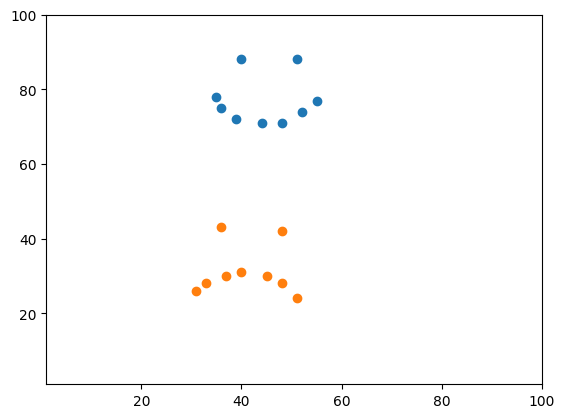

In [32]:
X = np.array([40, 88, 51, 88, 35, 78, 36, 75, 39, 72, 44, 71, 48, 71, 52, 74, 55, 77]);
Y = np.array([36, 43, 48, 42, 31, 26, 33, 28, 37, 30, 40, 31, 45, 30, 48, 28, 51, 24]);
X = X.reshape(-1, 2)
Y = Y.reshape(-1, 2)
plt.scatter(X[:,0], X[:,1])
plt.scatter(Y[:,0], Y[:,1])
plt.xlim((1, 100))
plt.ylim((1, 100))
plt.show()

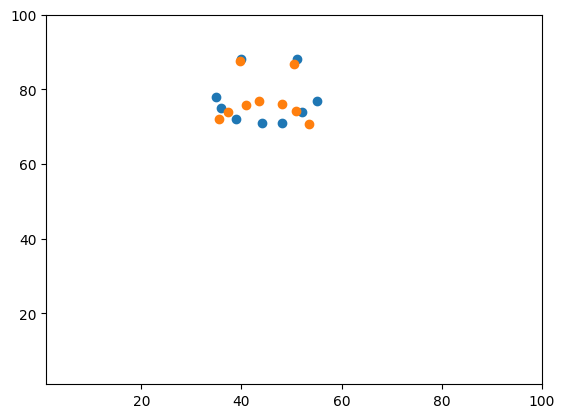

In [33]:
rotate, translate, Y2 = generalized_proc(X, Y)
# Y2 = Y @ rotate.T + translate

plt.scatter(X[:,0], X[:,1])
plt.scatter(Y2[:,0], Y2[:,1])
plt.xlim((1, 100))
plt.ylim((1, 100))
plt.show()

### Align the training data

Text(0.5, 1.0, 'align twice')

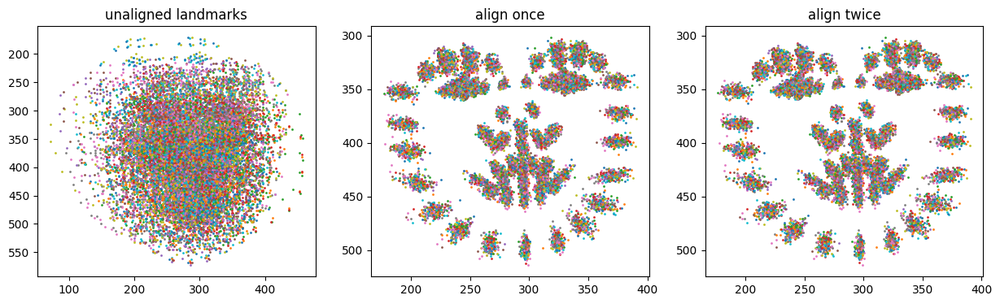

In [40]:
def show_landmarks(landmarks):
    for i in range(landmarks.shape[-1]):
        landmark = landmarks[:, i].reshape(-1, 2)
        plt.scatter(landmark[:,0], landmark[:,1], s=1)

plt.figure(figsize=(15, 4))
plt.subplot(1,3,1)
plt.gca().invert_yaxis()
show_landmarks(shape_model.unaligned_shapes)
plt.title("unaligned landmarks")
plt.subplot(1,3,2)
plt.gca().invert_yaxis()
show_landmarks(shape_model.aligned_shapes)
plt.title("align once")
plt.subplot(1,3,3)
plt.gca().invert_yaxis()
aligned_shapes2, w = shape_model.align(shape_model.aligned_shapes, 'modified_proc', return_w=True)
show_landmarks(aligned_shapes2)
plt.title("align twice")

In [41]:
w

array([0.00031987, 0.00034522, 0.00030145, 0.00026831, 0.00025521,
       0.00028875, 0.00035368, 0.00033675, 0.00035115, 0.00026573,
       0.00024226, 0.00027696, 0.00034733, 0.00040258, 0.00035482,
       0.00055984, 0.00056036, 0.00052933, 0.00050954, 0.00054306,
       0.00056324, 0.00048978, 0.00048359, 0.00049332, 0.00047815,
       0.00050358, 0.000485  , 0.00071236, 0.00069098, 0.00068402,
       0.00071235, 0.00066732, 0.00069158, 0.00072743, 0.00069452,
       0.00069539, 0.00066657, 0.0006914 , 0.00056802, 0.00049826,
       0.00054976, 0.00051384, 0.00059476, 0.00055618, 0.00055126,
       0.00070458, 0.00050888, 0.00049686, 0.00055899, 0.00053404,
       0.0004489 , 0.00044993, 0.00043487, 0.00049756, 0.0005466 ,
       0.00057452, 0.00042461, 0.00036873, 0.00041671, 0.00054344,
       0.00057877, 0.0005046 , 0.00055127, 0.00055683, 0.00055379,
       0.00057538, 0.00064152, 0.00039663, 0.00073855, 0.00072745,
       0.00072064, 0.00074591, 0.00073375, 0.00074509, 0.00071

Text(0.5, 1.0, 'align twice')

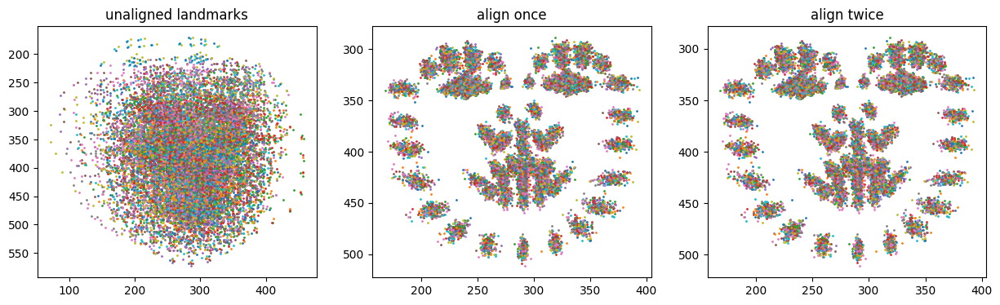

In [34]:
def show_landmarks(landmarks):
    for i in range(landmarks.shape[-1]):
        landmark = landmarks[:, i].reshape(-1, 2)
        plt.scatter(landmark[:,0], landmark[:,1], s=1)

plt.figure(figsize=(15, 4))
plt.subplot(1,3,1)
plt.gca().invert_yaxis()
show_landmarks(shape_model.unaligned_shapes)
plt.title("unaligned landmarks")
plt.subplot(1,3,2)
plt.gca().invert_yaxis()
show_landmarks(shape_model.aligned_shapes)
plt.title("align once")
plt.subplot(1,3,3)
plt.gca().invert_yaxis()
aligned_shapes2 = shape_model.align(shape_model.aligned_shapes)
show_landmarks(aligned_shapes2)
plt.title("align twice")

## PCA

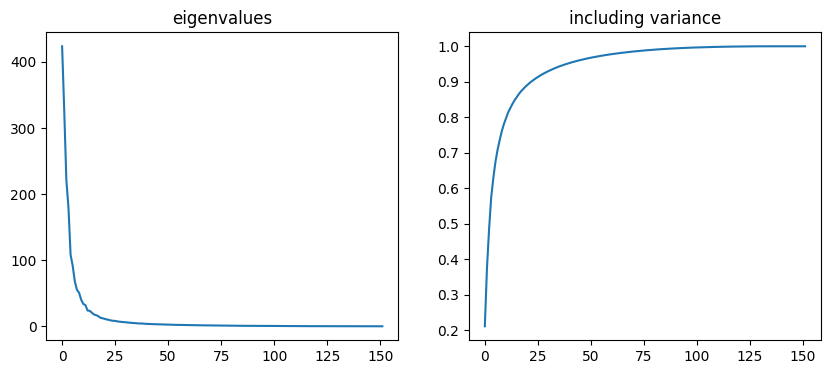

In [35]:
plt.figure(figsize=(10, 4))
plt.subplot(1,2,1)
plt.plot(shape_model.eig_val)
plt.title("eigenvalues")
plt.subplot(1,2,2)
plt.plot(np.cumsum(shape_model.eig_val)/np.sum(shape_model.eig_val))
plt.title("including variance")
plt.show()

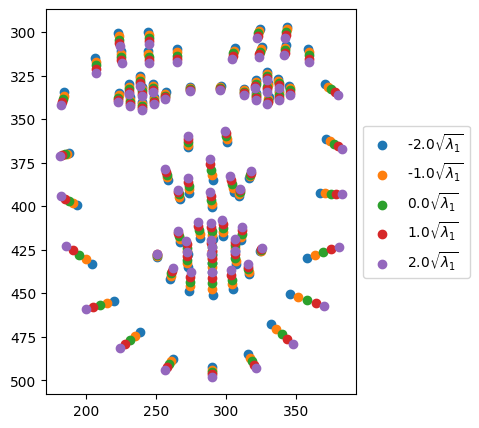

In [36]:
plt.figure(figsize=(5, 5))
ax = plt.subplot(1,1,1)
# plt.scatter(shape_model.x_mean[::2], shape_model.x_mean[1::2])
# plt.rcParams['text.usetex'] = False
x_mean = shape_model.x_mean
p1 = shape_model.eig_vec[:,0]
lambda1 = shape_model.eig_val[0]
for i, coeff in enumerate(np.linspace(-2, 2, 5)):

    # plt.subplot(1, 5, i+1)
    shape_shifted = x_mean + p1 * coeff * np.sqrt(lambda1)
    plt.scatter(shape_shifted[::2], shape_shifted[1::2], label="{}".format(coeff)+r"$\sqrt{\lambda_1}$")
    plt.gca().invert_yaxis()
    # plt.title("shift b1 = {}".format(coeff))

box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

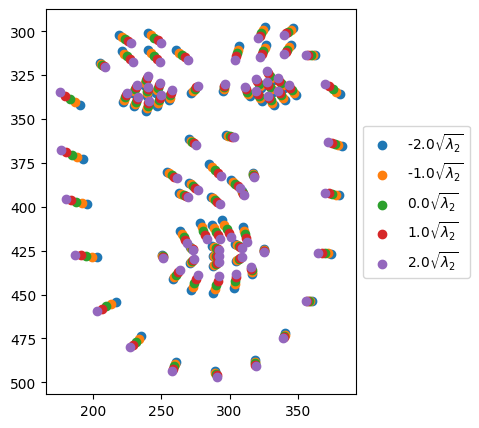

In [37]:
plt.figure(figsize=(5, 5))
ax = plt.subplot(1,1,1)
# plt.scatter(shape_model.x_mean[::2], shape_model.x_mean[1::2])
# plt.rcParams['text.usetex'] = False
x_mean = shape_model.x_mean
p1 = shape_model.eig_vec[:,1]
lambda1 = shape_model.eig_val[1]
for i, coeff in enumerate(np.linspace(-2, 2, 5)):

    # plt.subplot(1, 5, i+1)
    shape_shifted = x_mean + p1 * coeff * np.sqrt(lambda1)
    plt.scatter(shape_shifted[::2], shape_shifted[1::2], label="{}".format(coeff)+r"$\sqrt{\lambda_2}$")
    plt.gca().invert_yaxis()
    # plt.title("shift b1 = {}".format(coeff))

box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Gray model

In [38]:
from models import One_level_gray_model
gray_model = One_level_gray_model(face_files, {"window_size": 5}, np.rint(landmarks.reshape(-1, 2, landmarks.shape[1])).astype(np.int32))

## Smoothing kernel

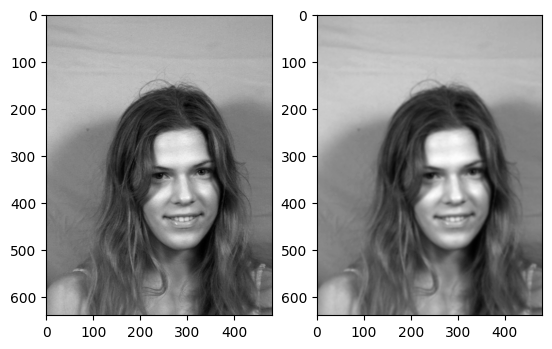

In [47]:
plt.subplot(1,2,1)
im11 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
plt.imshow(im11, cmap='gray')
plt.subplot(1,2,2)
smooth_image = cv2.GaussianBlur(im11,(7, 7), 0)
plt.imshow(smooth_image, cmap='gray')
plt.show()

## Edge strength

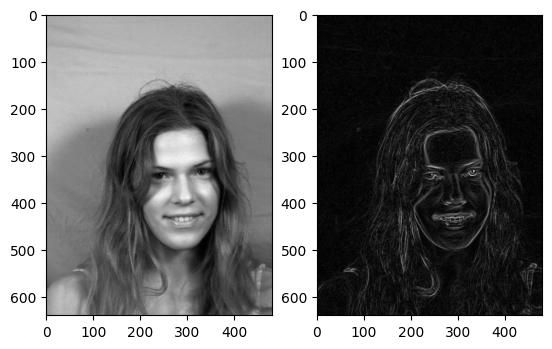

In [48]:
plt.subplot(1,2,1)
im11 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
plt.imshow(im11, cmap='gray')
plt.subplot(1,2,2)
im_edge = gray_model.edge_feature(im11)
plt.imshow(im_edge, cmap='gray')
plt.show()

# Find the Face

In [42]:
from models import Face_Detect
face_detect = Face_Detect(shape_model, gray_model, search_size=10)

1


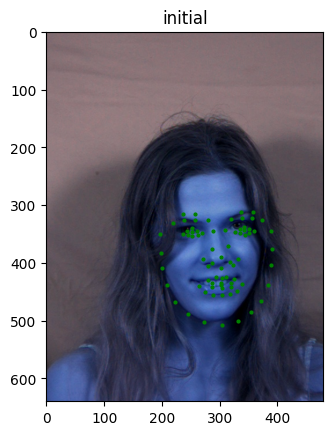

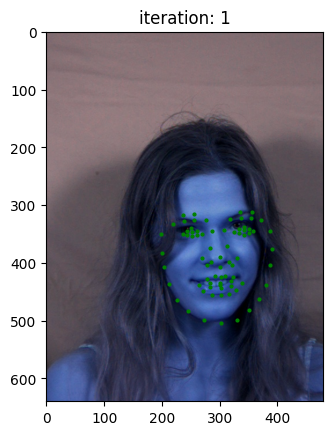

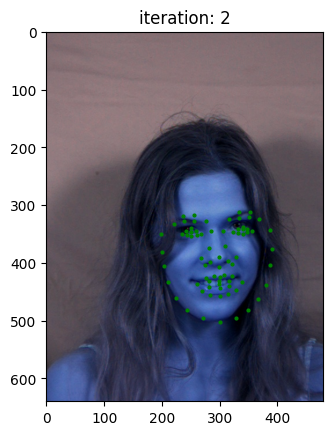

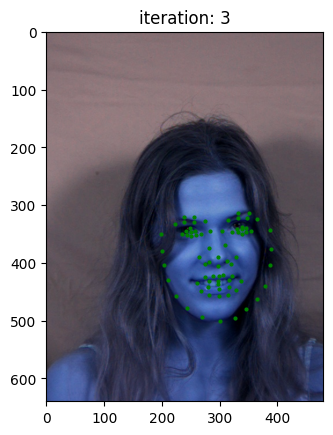

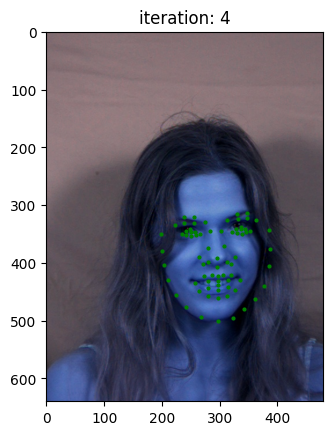

...

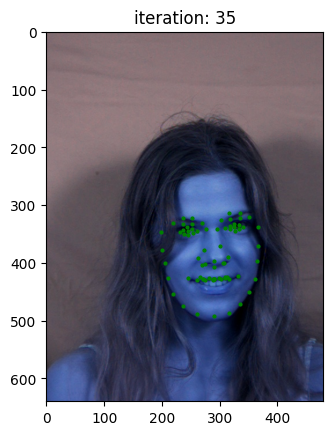

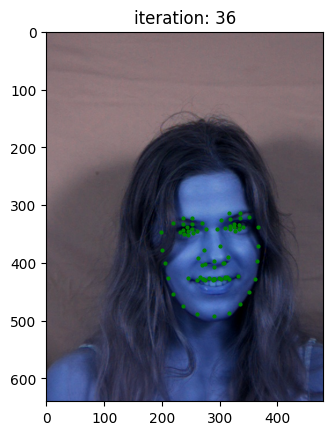

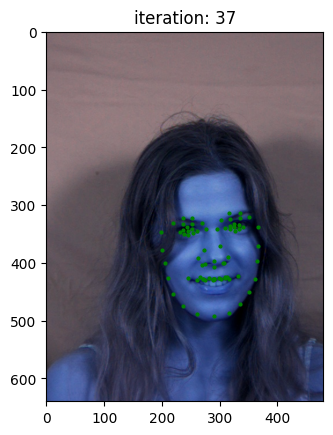

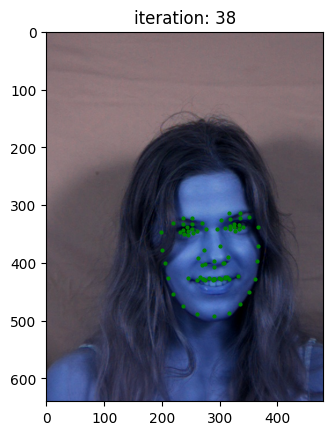

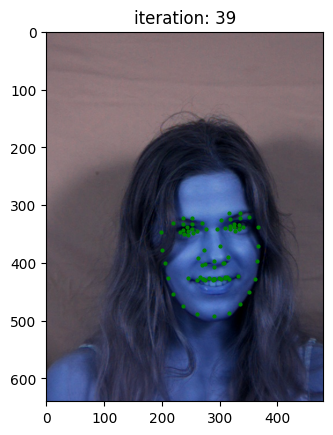

In [54]:
features = []
def callback(feature, i):
    if i % 1 == 0:
        kkk2 = feature.reshape(-1, 2)
        features.append((kkk2, i))
        plt.imshow(im1, cmap='gray')
        plt.scatter(kkk2[:,0], kkk2[:,1], s=4, color='g')
        if i == 0:
            plt.title("initial")
        else:
            plt.title("iteration: {}".format(i))
        plt.show()
    return
im1 = cv2.imread(face_files[0])
kkk = face_detect(im1, max_iter=40, n_pcs=8, callback=callback)

/tmp/ipykernel_2627004/2381899856.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


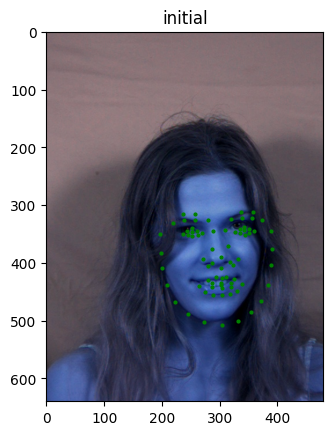

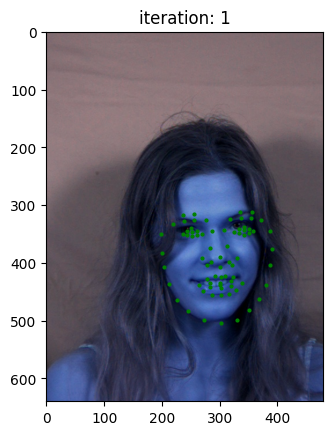

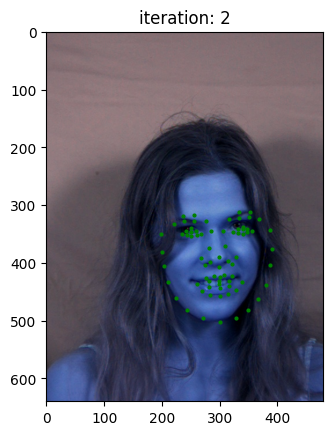

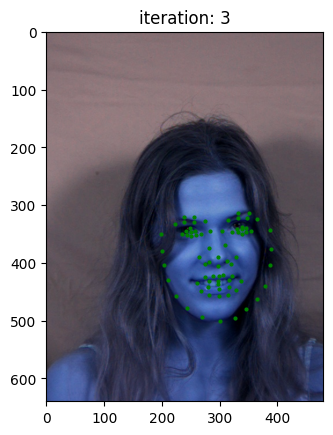

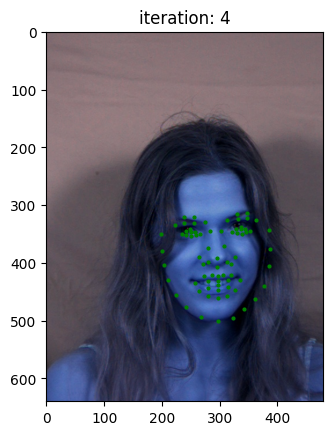

...

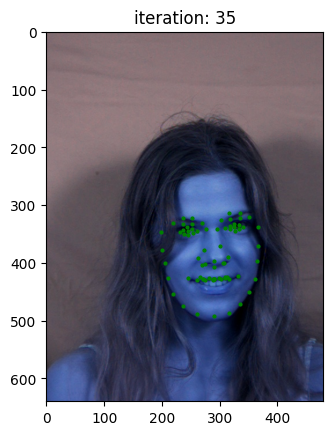

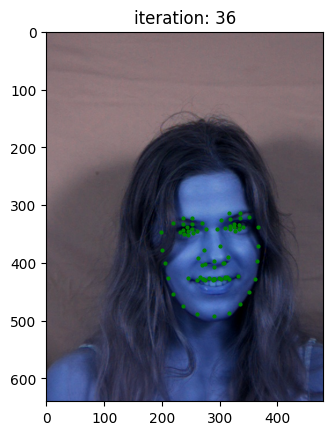

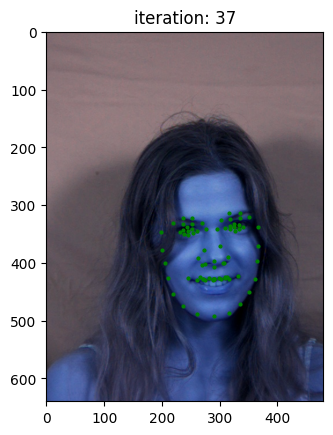

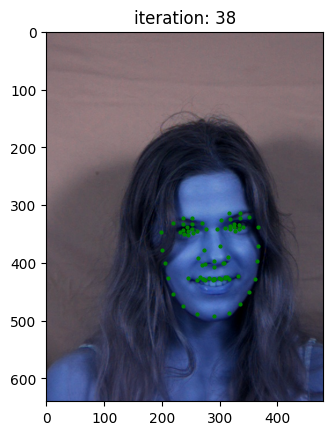

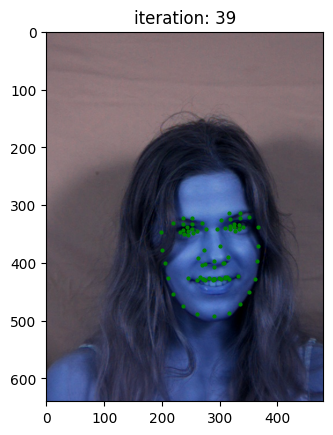

In [55]:
save_dir = "results/try3"
pathlib.Path(save_dir).mkdir(parents=True, exist_ok=True)
for feature, i in features:
    fig = plt.figure()
    plt.imshow(im1, cmap='gray')
    plt.scatter(feature[:,0], feature[:,1], s=4, color='g')
    if i == 0:
        plt.title("initial")
    else:
        plt.title("iteration: {}".format(i))
    plt.savefig("{}/{}.jpg".format(save_dir, i))

In [56]:
import imageio
with imageio.get_writer(f'{save_dir}/animation.gif', mode='I', duration=1) as writer:
    for i in range(len(features)):
        image = imageio.imread("{}/{}.jpg".format(save_dir, i))
        writer.append_data(image)

/tmp/ipykernel_2627004/2565142144.py:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread("{}/{}.jpg".format(save_dir, i))
